<a href="https://colab.research.google.com/github/retuyu88/digitalentkominfo/blob/master/Copy_of_%5B28_5%5D_Deep_Dream_using_TF2_ADF.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src = "https://i.imgur.com/UjutVJd.jpg" align = "center">

# DeepDream menggunakan TensorFlow 2.0

DeepDream adalah eksperimen yang memvisualisasikan pola yang dipelajari oleh jaringan saraf. Mirip dengan ketika seorang anak menonton awan dan mencoba untuk menafsirkan bentuk acak, DeepDream over-interpretasi dan meningkatkan pola yang dilihatnya dalam gambar.

Proses ini dilakukan dengan meneruskan gambar melalui jaringan, kemudian menghitung gradien gambar sehubungan dengan aktivasi lapisan tertentu. Gambar kemudian dimodifikasi untuk meningkatkan aktivasi ini, meningkatkan pola yang dilihat oleh jaringan, dan menghasilkan gambar seperti mimpi. 

Proses ini dijuluki "Inceptionism" (referensi ke InceptionNet, dan Inception film).

Mari kita tunjukkan bagaimana Anda bisa membuat jaringan saraf "mimpi" dan meningkatkan pola nyata yang dilihatnya dalam gambar.

## Install TensorFlow 2.0
Karena tutorial ini menggunakan TensorFlow 2.0,
kita harus menginstallnya terlebih dahulu

In [1]:
from __future__ import absolute_import, division, print_function, unicode_literals

!pip install tensorflow-gpu==2.0.0-beta1

     |████████████████████████████████| 348.9MB 70kB/s 
     |████████████████████████████████| 501kB 53.4MB/s 
     |████████████████████████████████| 3.1MB 48.6MB/s 


## Import Modul

In [0]:
import tensorflow as tf

from IPython.display import clear_output
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams['figure.figsize'] = (15, 15)

## Siapkan Gambar Konten

Pada contoh kali ini, kita akan gunakan gambar pemandangan tebing gunung Pilatus

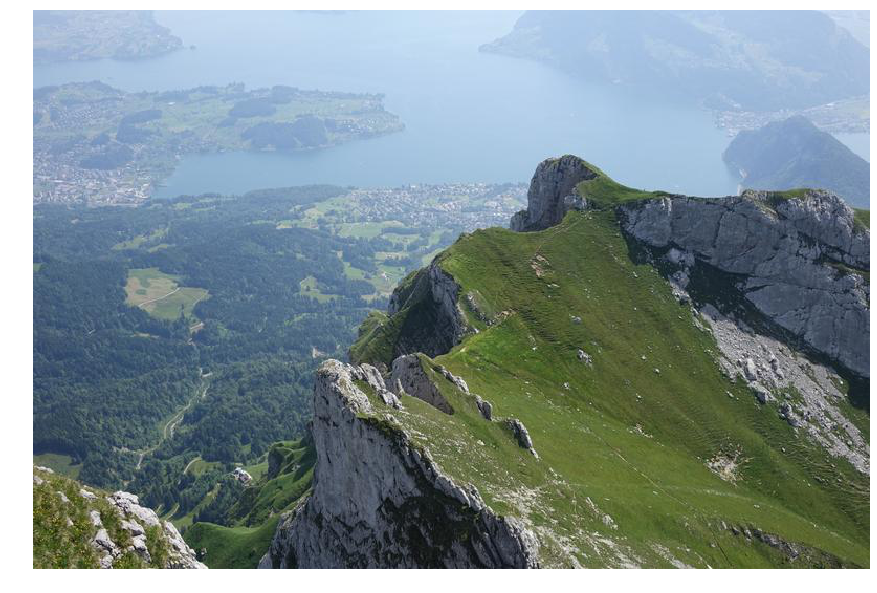

In [3]:
url = 'https://raw.githubusercontent.com/tensorflow/tensorflow/master/tensorflow/examples/tutorials/deepdream/pilatus800.jpg'

image_path = tf.keras.utils.get_file('myImage.jpg', origin=url)
original_img = tf.keras.preprocessing.image.load_img(image_path)
plt.imshow(original_img)
plt.axis('off')
plt.show()

## Download Inception Model
Untuk contoh kali ini, kita gunakan model InceptionV3

In [0]:
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

Daftar nama layer yang ada di dalam InceptionV3 dapat dilihat jika mengaktifkan cell di bawah

daftar nama tersebut bisa dipilih sebagai layer yang akan menghalusinasi gambar

In [0]:
# base_model.summary()

## Preproses Gambar

Praproses gambar agar sesuai dengan model InceptionV3

In [0]:
img = tf.keras.preprocessing.image.img_to_array(original_img)
img = tf.Variable(tf.keras.applications.inception_v3.preprocess_input(img))

## Pilih Layer DeepDream

Gagasan dalam DeepDream adalah untuk memilih lapisan (atau lapisan) dan memaksimalkan "loss" agar gambar semakin "mengaktivasi" layer yang dipilih. Kompleksitas fitur yang dimasukkan tergantung pada lapisan yang dipilih

Layer di awal jaringan menghasilkan goresan atau pola sederhana, sementara lapisan yang lebih dalam memberikan fitur kompleks dalam gambar, atau bahkan seluruh objek.

Di sini, kita pilih dan definisikan layer-layer mana saja yang akan digunakan untuk memberikan halusinasi pada gambar

In [0]:
names = ['mixed2', 'mixed4', 'mixed6']
layers = [base_model.get_layer(name).output for name in names]

# Create our feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

## Helper Function
Fungsi bantuan untuk menghitung loss DeepDream dan memproses gambar output

In [0]:
def calc_loss(image):
  image = image[None, ...]
  layer_activations = dream_model(image)

  losses = []
  for act in layer_activations:
    loss = tf.math.reduce_mean(act)
    losses.append(loss)
  total_loss = tf.add_n(losses)
  return total_loss

def deprocess(img):
  return (img + 1.0)/2.0

## Gradient Ascent
Fungsi optimasi Gradient Ascent untuk menjalankan proses DeepDream

Menambahkan gradien ke gambar meningkatkan pola yang dilihat oleh jaringan. Pada setiap langkah, kita akan menciptakan gambar yang semakin mengaktivasi layer yang dipilih dalam jaringan.

In [0]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.005)

@tf.function
def deepdream():
  with tf.GradientTape() as tape:
    loss = -calc_loss(img)
  gradient = tape.gradient(loss, img)

  optimizer.apply_gradients([(gradient, img)])
  img.assign(tf.clip_by_value(img, -1, 1))
  return loss


## Mulai Optimasi
Di sini, mari kita mulai optimasi DeepDream selama 500 iterasi

In [0]:
STEPS = 1500

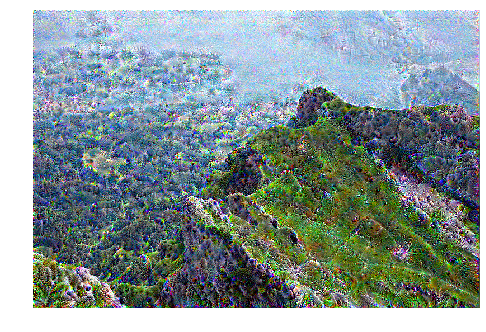

Step 0, loss 3.152464


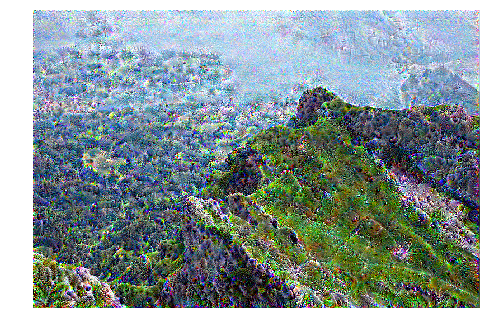

Step 50, loss 3.332965


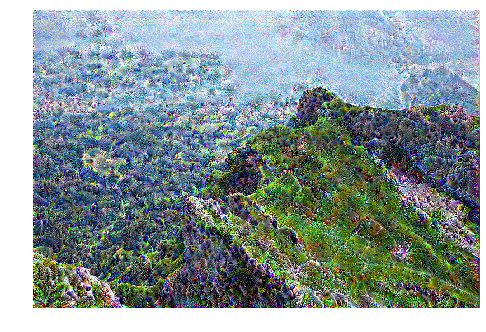

Step 100, loss 3.506013


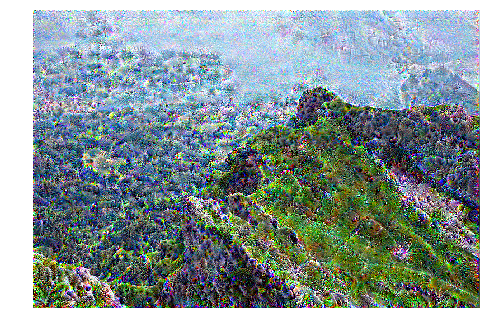

Step 150, loss 3.683400


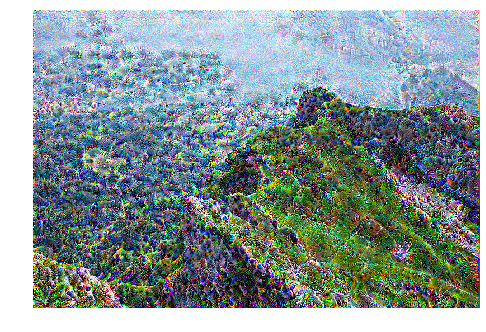

Step 200, loss 3.859680


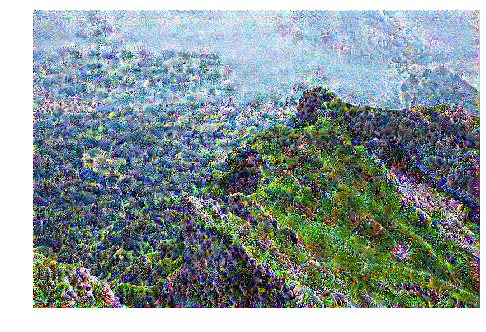

Step 250, loss 4.038455


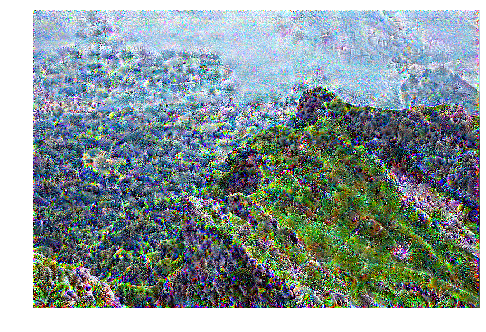

Step 300, loss 4.216883


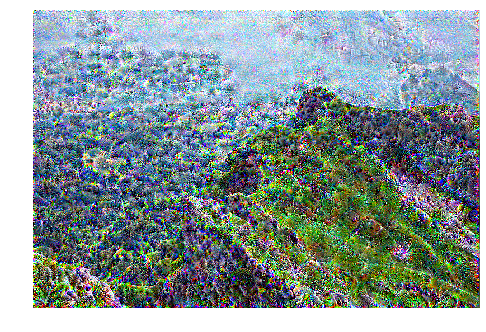

Step 350, loss 4.389163


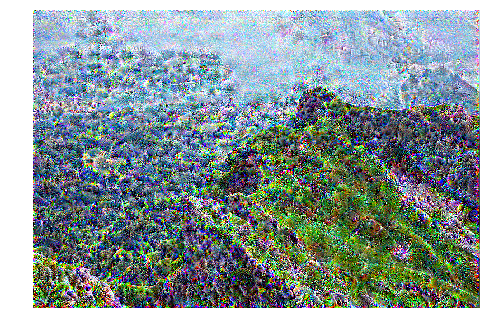

Step 400, loss 4.552087


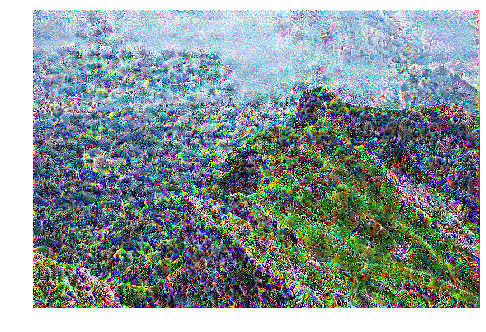

Step 450, loss 4.728739


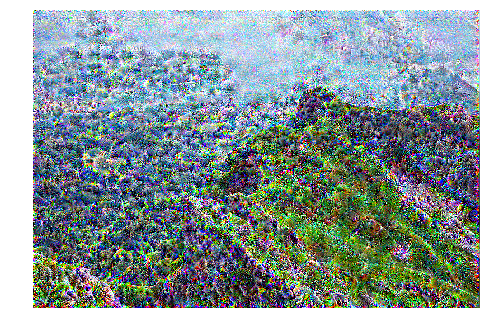

Step 500, loss 4.937419


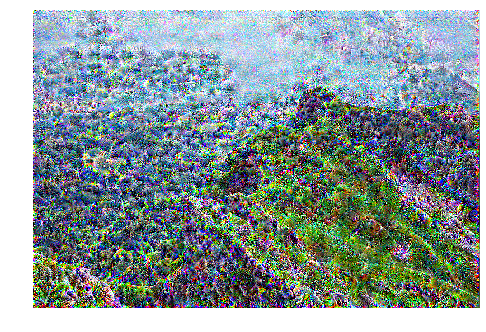

Step 550, loss 5.112413


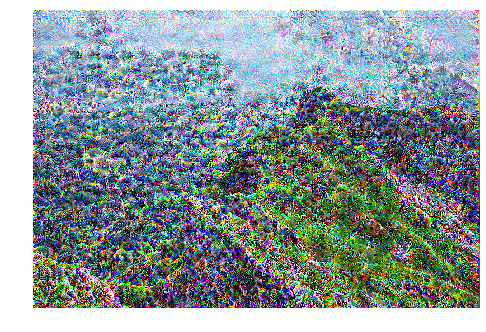

Step 600, loss 5.261802


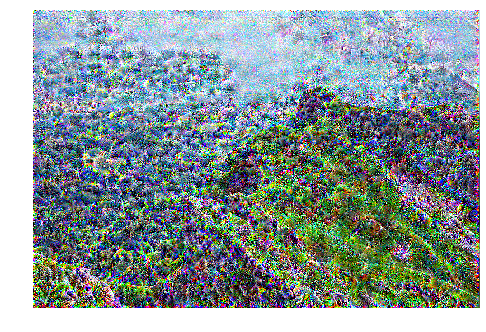

Step 650, loss 5.388193


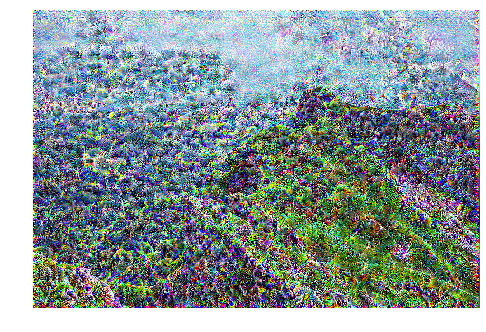

Step 700, loss 5.500603


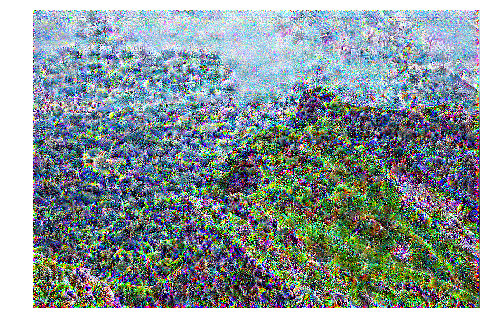

Step 750, loss 5.603580


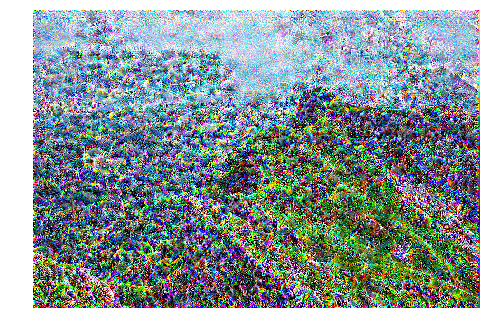

Step 800, loss 5.698497


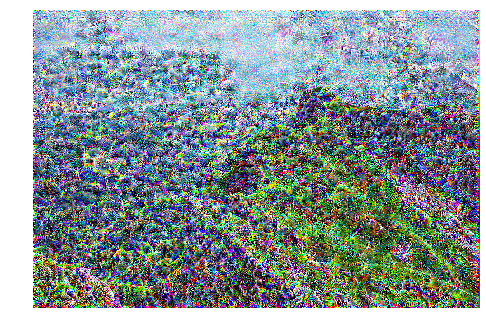

Step 850, loss 5.785233


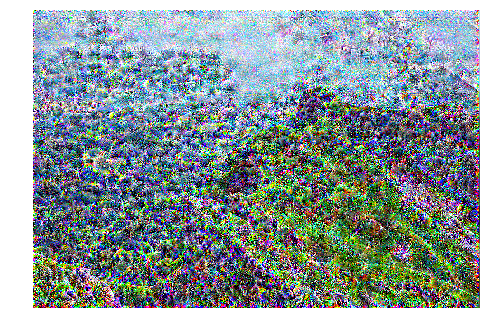

Step 900, loss 5.865082


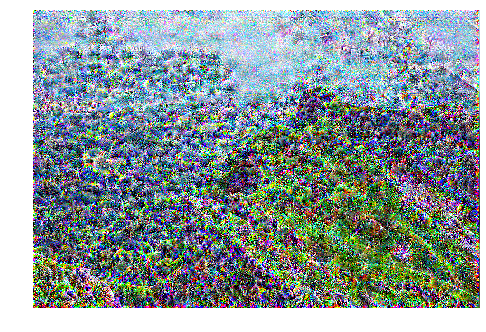

Step 950, loss 5.939399


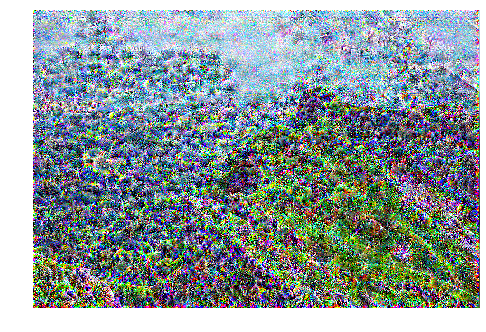

Step 1000, loss 6.008579


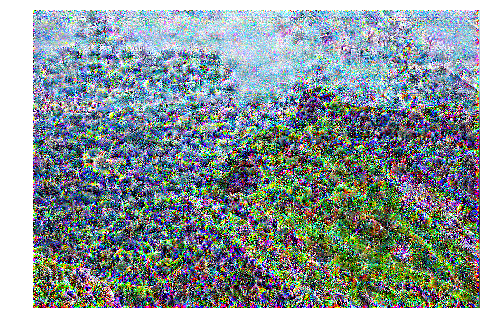

Step 1050, loss 6.073256


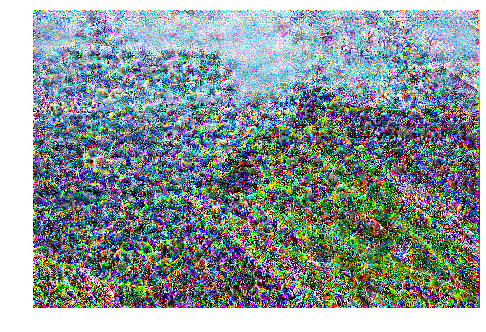

Step 1100, loss 6.134722


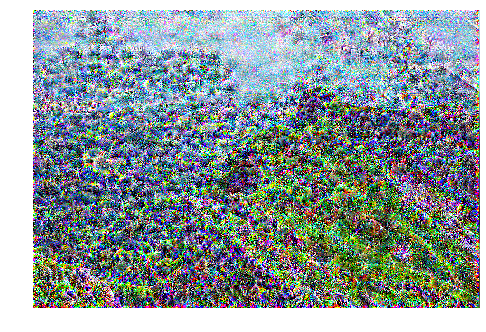

Step 1150, loss 6.191751


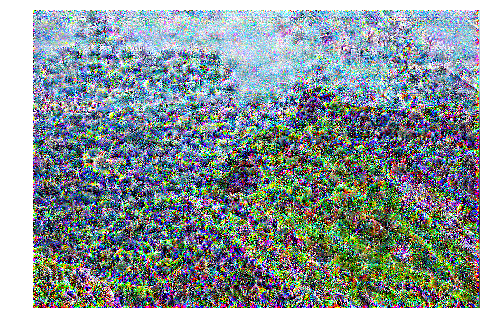

Step 1200, loss 6.245595


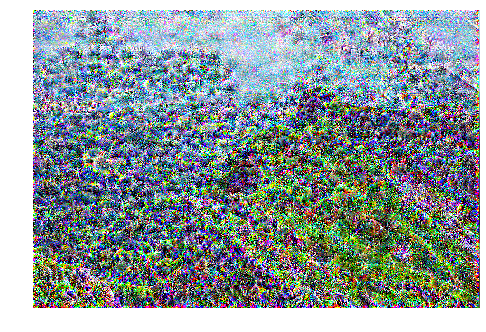

Step 1250, loss 6.296856


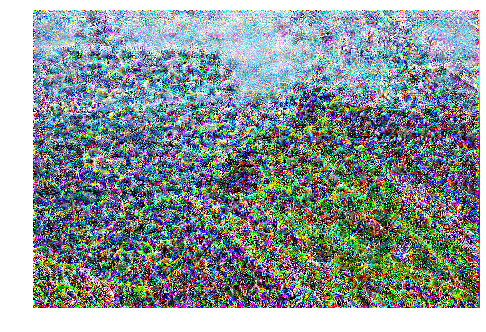

Step 1300, loss 6.344697


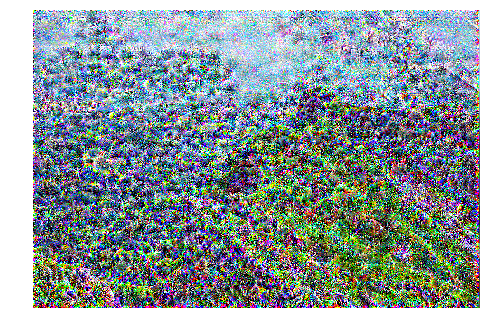

Step 1350, loss 6.389992


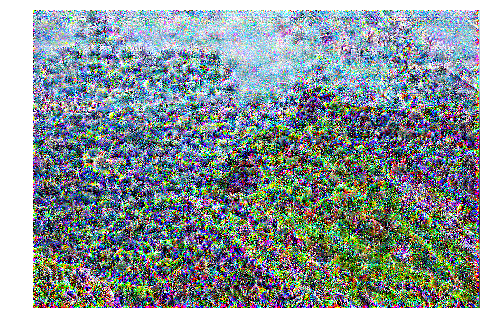

Step 1400, loss 6.433048


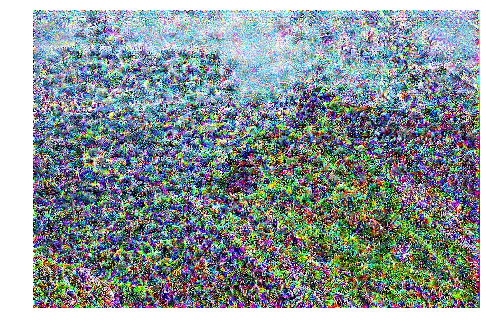

Step 1450, loss 6.473781


Final Result


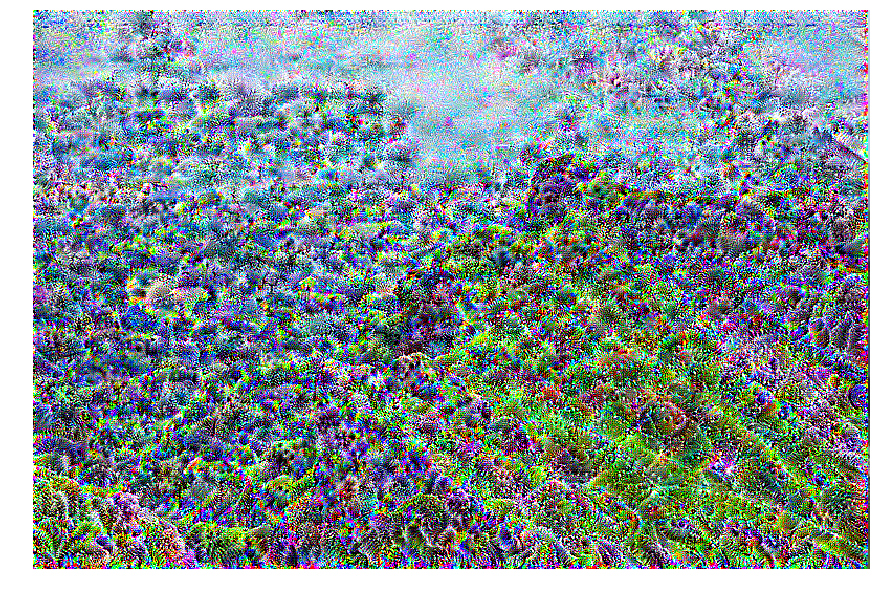

In [13]:
mpl.rcParams['figure.figsize'] = (8, 8)
mpl.rcParams['axes.grid'] = False

for step in range(STEPS):
  loss = deepdream()
  if step % 50 == 0:
    plt.imshow(deprocess(img))
    plt.axis('off')
    plt.show()
    print ('Step %d, loss %f' % (step, -1.0*loss))



print('\n\nFinal Result')
mpl.rcParams['figure.figsize'] = (15, 15)
plt.imshow(deprocess(img))
plt.axis('off')
plt.show()

Bagaimana hasil DeepDream-nya?

Nyenyak?

Cobalah ubah menggunakan layer yang lain

<p>Copyright &copy; 2019 <a href=https://www.linkedin.com/in/andityaarifianto/>ADF</a> </p>